# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12169, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 12169 (delta 0), reused 2 (delta 0), pack-reused 12167
Receiving objects: 100% (12169/12169), 11.95 MiB | 25.98 MiB/s, done.
Resolving deltas: 100% (8427/8427), done.
/content/yolov5
     |████████████████████████████████| 596 kB 8.2 MB/s 
     |████████████████████████████████| 145 kB 7.2 MB/s 
     |████████████████████████████████| 178 kB 65.9 MB/s 
     |████████████████████████████████| 1.1 MB 65.3 MB/s 
     |████████████████████████████████| 67 kB 6.3 MB/s 
     |████████████████████████████████| 54 kB 3.7 MB/s 
     |████████████████████████████████| 138 kB 77.1 MB/s 
     |████████████████████████████████| 63 kB 2.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1

In [ ]:
# from roboflow import Roboflow
# rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
# os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("set200")
# dataset = project.version(9).download("yolov5")

# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("set200")
# dataset = project.version(14).download("yolov5")

# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("electronenergy")
# dataset = project.version(1).download("yolov5")

# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("inferenceset50")
# dataset = project.version(1).download("yolov5")

# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("set100")
# dataset = project.version(2).download("yolov5")

# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("smallset50")
# dataset = project.version(2).download("yolov5")

# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("miniset20")
# dataset = project.version(4).download("yolov5")

# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("set15")
# dataset = project.version(1).download("yolov5")

# from roboflow import Roboflow
# rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
# project = rf.workspace("jinpu-lin").project("electron50")
# dataset = project.version(17).download("yolov5")

from roboflow import Roboflow
rf = Roboflow(api_key="VNv23i6OWbQyZ6AmrxMn")
project = rf.workspace("jinpu-lin").project("damage50")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to damage50-1 in yolov5pytorch:: 100%|██████████| 240/240 [00:00<00:00, 1463.86it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
# Weights & Biases  (optional)
%pip install -q wandb
import wandb
wandb.login()

     |████████████████████████████████| 1.7 MB 12.1 MB/s 
     |████████████████████████████████| 144 kB 44.1 MB/s 
     |████████████████████████████████| 181 kB 48.3 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 


<IPython.core.display.Javascript object>

KeyboardInterrupt: ignored

In [ ]:
import time
start = time.time()
!python train.py --img 416 --batch 16 --epochs 1000 --data {dataset.location}/data.yaml --weights /content/yolov5/bestSet200v9.pt --cache
end = time.time()
print(end - start)

train: weights=/content/yolov5/bestSet200v9.pt, cfg=, data=/content/yolov5/set15-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1000, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-105-gd257c75 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_

In [ ]:
import time
start = time.time()
!python train.py --img 416 --batch 16 --optimizer SGD --epochs 1000 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache
end = time.time()
print(end - start)

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/damage50-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1000, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-140-g3f3852e torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.

In [ ]:
import time
start = time.time()
!python train.py --hyp /content/yolov5/data/hyps/hyp.VOC.yaml --batch 32 --optimizer SGD --epochs 1000 --data {dataset.location}/data.yaml --weights /content/yolov5/runs/train/exp/weights/best.pt --cache
end = time.time()
print(end - start)

train: weights=/content/yolov5/runs/train/exp/weights/best.pt, cfg=, data=/content/yolov5/damage50-1/data.yaml, hyp=/content/yolov5/data/hyps/hyp.VOC.yaml, epochs=1000, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-140-g3f3852e torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.00334, lrf=0.15135, momentum=0.74832, weight_decay=0.00025, warmup_epochs=3.3835, warmup_momentum=0.59462, warmup_bias_lr=0.18657, box=0.02, cls=0.21638, cls_pw=0.5, obj=0.51728, obj_pw=0.67198, iou_t=0.

In [ ]:
dataset.location

'/content/yolov5/damage50-1'

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp2/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# !python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/test/images --save-txt --hide-conf
!python detect.py --weights /content/yolov5/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images --save-txt --hide-conf --hide-labels

detect: weights=['/content/yolov5/best.pt'], source=/content/yolov5/damage50-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=True, half=False, dnn=False
YOLOv5 🚀 v6.1-143-g6ea81bb torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/9 /content/yolov5/damage50-1/test/images/20210902_124753640_111419_01_png.rf.66b8810f48e32453ef5447ed08dda73c.jpg: 416x416 Done. (0.014s)
image 2/9 /content/yolov5/damage50-1/test/images/20211006_215025014_033827_01_png.rf.262d719c755b55ac9f5bdde749ebf06f.jpg: 416x416 4 burns, Done. (0.014s)
image 3/9 /content/yolov5/damage50-1/test/images/20211102_2235447

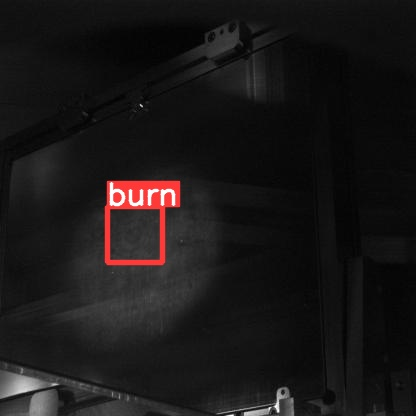

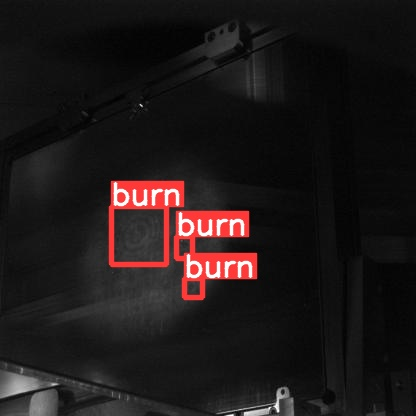

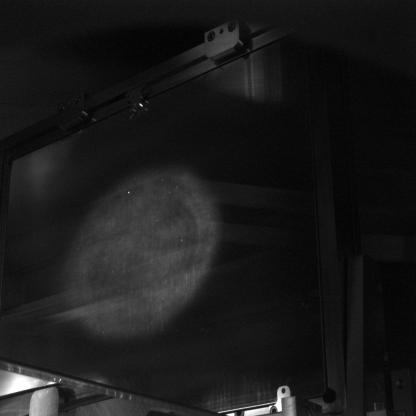

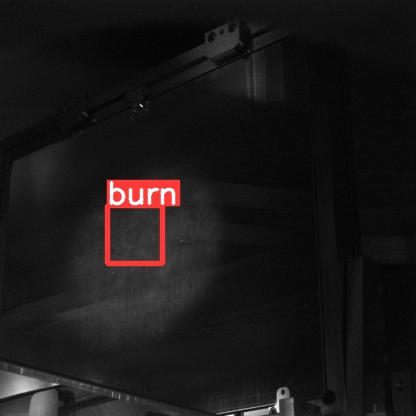

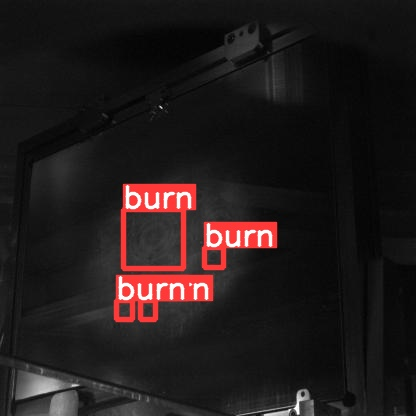

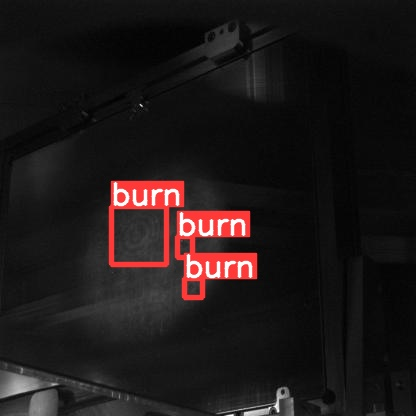

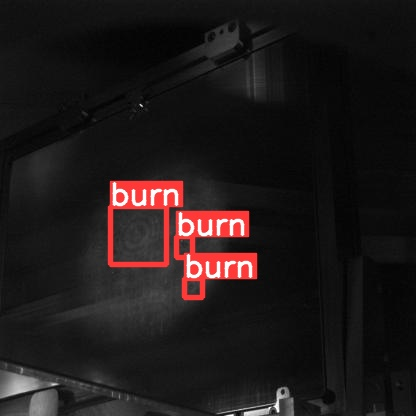

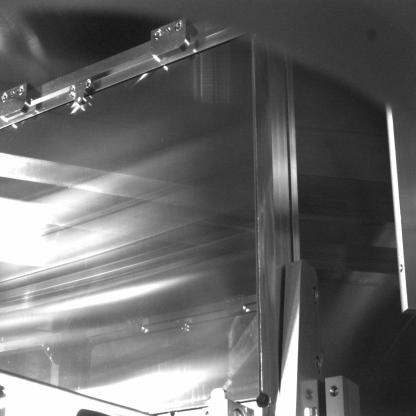

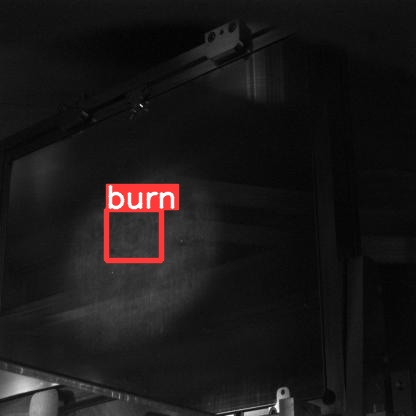

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!zip -r /content/valid.zip /content/yolov5/electron50-17/valid

  adding: content/yolov5/electron50-17/valid/ (stored 0%)
  adding: content/yolov5/electron50-17/valid/labels/ (stored 0%)
  adding: content/yolov5/electron50-17/valid/labels/20220325_032_1389_eSpecHighE--23123972-_png.rf.7f7c918c7aa2d0469dd26849223d0109.txt (deflated 49%)
  adding: content/yolov5/electron50-17/valid/labels/20220325_032_1387_eSpecHighE--23123972-_png.rf.f277d253f56f91aea3792608d0ef39ce.txt (deflated 49%)
  adding: content/yolov5/electron50-17/valid/labels/20220325_032_1422_eSpecHighE--23123972-_png.rf.cbec86a1563ade392b324918ee43cb5c.txt (deflated 57%)
  adding: content/yolov5/electron50-17/valid/labels/20210330_006_0451_eSpecHighE--23123972-_png.rf.5e6b2b9b31eb547f4794d1e57f5416cb.txt (deflated 52%)
  adding: content/yolov5/electron50-17/valid/labels/20220325_032_1416_eSpecHighE--23123972-_png.rf.009e699d6dade1e4bea4072789e3046b.txt (deflated 50%)
  adding: content/yolov5/electron50-17/valid/labels/20220325_032_1398_eSpecHighE--23123972-_png.rf.48af5016747fe438022f48c

In [ ]:
!zip -r /content/testFineTune.zip /content/yolov5/runs/detect/exp

  adding: content/yolov5/runs/detect/exp/ (stored 0%)
  adding: content/yolov5/runs/detect/exp/20211006_215025014_033827_01_png.rf.262d719c755b55ac9f5bdde749ebf06f.jpg (deflated 7%)
  adding: content/yolov5/runs/detect/exp/20220413_232507623_026699_01_png.rf.3d02dcb46eb48971f6603f749eb6d94b.jpg (deflated 8%)
  adding: content/yolov5/runs/detect/exp/20211112_193015181_027059_01_png.rf.37b47a356629f71bf1d02452574ed88a.jpg (deflated 8%)
  adding: content/yolov5/runs/detect/exp/20211102_223544742_007872_01_png.rf.f6deeed4866fafbca565e5aa54f25e95.jpg (deflated 7%)
  adding: content/yolov5/runs/detect/exp/20211103_000400744_008487_01_png.rf.3e1efcf5617f55337bee46e3f22c03ac.jpg (deflated 7%)
  adding: content/yolov5/runs/detect/exp/labels/ (stored 0%)
  adding: content/yolov5/runs/detect/exp/labels/20211112_193015181_027059_01_png.rf.37b47a356629f71bf1d02452574ed88a.txt (deflated 9%)
  adding: content/yolov5/runs/detect/exp/labels/20211006_215025014_033827_01_png.rf.262d719c755b55ac9f5bdde749

In [ ]:
!zip -r /content/model.zip /content/yolov5/runs/train/exp2

  adding: content/yolov5/runs/train/exp2/ (stored 0%)
  adding: content/yolov5/runs/train/exp2/train_batch1.jpg (deflated 17%)
  adding: content/yolov5/runs/train/exp2/results.png (deflated 10%)
  adding: content/yolov5/runs/train/exp2/labels.jpg (deflated 41%)
  adding: content/yolov5/runs/train/exp2/train_batch2.jpg (deflated 15%)
  adding: content/yolov5/runs/train/exp2/val_batch0_labels.jpg (deflated 18%)
  adding: content/yolov5/runs/train/exp2/labels_correlogram.jpg (deflated 43%)
  adding: content/yolov5/runs/train/exp2/val_batch0_pred.jpg (deflated 17%)
  adding: content/yolov5/runs/train/exp2/hyp.yaml (deflated 43%)
  adding: content/yolov5/runs/train/exp2/events.out.tfevents.1650474626.1442b7009775.757.0 (deflated 55%)
  adding: content/yolov5/runs/train/exp2/PR_curve.png (deflated 31%)
  adding: content/yolov5/runs/train/exp2/train_batch0.jpg (deflated 10%)
  adding: content/yolov5/runs/train/exp2/weights/ (stored 0%)
  adding: content/yolov5/runs/train/exp2/weights/last.pt 

In [ ]:
!python detect.py --weights /content/yolov5/best.pt --img 416 --conf 0.1 --source /content/yolov5/pressureScan2/ --hide-conf --save-txt

detect: weights=['/content/yolov5/best.pt'], source=/content/yolov5/pressureScan2/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=True, half=False, dnn=False
YOLOv5 🚀 v6.1-243-g7cef03d Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients
image 1/195 /content/yolov5/pressureScan2/20210331_012_1030_ProbeMagnified (23187222).png: 416x416 1 dust, 1 plasmawave, Done. (0.009s)
image 2/195 /content/yolov5/pressureScan2/20210331_012_1031_ProbeMagnified (23187222).png: 416x416 1 plasmawave, Done. (0.009s)
image 3/195 /content/yolov5/pressureScan2/20210331_012_1032_ProbeMagnified (23187222).png: 416x416 2 dusts, 

In [ ]:
!zip -r /content/pressureScan2.zip /content/yolov5/runs/detect/exp2

  adding: content/yolov5/runs/detect/exp2/ (stored 0%)
  adding: content/yolov5/runs/detect/exp2/20210331_018_1190_ProbeMagnified (23187222).png (deflated 51%)
  adding: content/yolov5/runs/detect/exp2/20210331_014_1097_ProbeMagnified (23187222).png (deflated 16%)
  adding: content/yolov5/runs/detect/exp2/20210331_017_1168_ProbeMagnified (23187222).png (deflated 15%)
  adding: content/yolov5/runs/detect/exp2/20210331_016_1131_ProbeMagnified (23187222).png (deflated 16%)
  adding: content/yolov5/runs/detect/exp2/20210331_015_1124_ProbeMagnified (23187222).png (deflated 16%)
  adding: content/yolov5/runs/detect/exp2/20210331_018_1203_ProbeMagnified (23187222).png (deflated 17%)
  adding: content/yolov5/runs/detect/exp2/20210331_016_1144_ProbeMagnified (23187222).png (deflated 17%)
  adding: content/yolov5/runs/detect/exp2/20210331_014_1089_ProbeMagnified (23187222).png (deflated 17%)
  adding: content/yolov5/runs/detect/exp2/20210331_014_1090_ProbeMagnified (23187222).png (deflated 18%)


In [ ]:
!zip -r /content/modelV2AdamfineTuneSGD.zip /content/yolov5/runs/train/exp6

  adding: content/yolov5/runs/train/exp6/ (stored 0%)
  adding: content/yolov5/runs/train/exp6/train_batch1.jpg (deflated 7%)
  adding: content/yolov5/runs/train/exp6/results.png (deflated 8%)
  adding: content/yolov5/runs/train/exp6/labels.jpg (deflated 37%)
  adding: content/yolov5/runs/train/exp6/train_batch2.jpg (deflated 9%)
  adding: content/yolov5/runs/train/exp6/val_batch0_labels.jpg (deflated 15%)
  adding: content/yolov5/runs/train/exp6/labels_correlogram.jpg (deflated 42%)
  adding: content/yolov5/runs/train/exp6/val_batch0_pred.jpg (deflated 14%)
  adding: content/yolov5/runs/train/exp6/hyp.yaml (deflated 43%)
  adding: content/yolov5/runs/train/exp6/PR_curve.png (deflated 19%)
  adding: content/yolov5/runs/train/exp6/train_batch0.jpg (deflated 7%)
  adding: content/yolov5/runs/train/exp6/weights/ (stored 0%)
  adding: content/yolov5/runs/train/exp6/weights/last.pt (deflated 8%)
  adding: content/yolov5/runs/train/exp6/weights/best.pt (deflated 8%)
  adding: content/yolov5/

In [ ]:
# load saved model from here
!python detect.py --weights /content/yolov5/best.pt --img 416 --conf 0.4 --source /content/yolov5/damage/ --save-txt --hide-conf --hide-labels

detect: weights=['/content/yolov5/best.pt'], source=/content/yolov5/damage/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=True, half=False, dnn=False
YOLOv5 🚀 v6.1-143-g6ea81bb torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/300 /content/yolov5/damage/20210927_180633371_017934_01.png: 352x416 5 burns, Done. (0.015s)
image 2/300 /content/yolov5/damage/20210927_180648371_017935_01.png: 352x416 5 burns, Done. (0.013s)
image 3/300 /content/yolov5/damage/20210927_180650371_017936_01.png: 352x416 5 burns, Done. (0.013s)
image 4/300 /content/yolov5/damage/20210927_180652372_017937_01.png: 352x416 5

In [ ]:
!zip -r /content/damageV1confp3.zip /content/yolov5/runs/detect/exp2/

  adding: content/yolov5/runs/detect/exp2/ (stored 0%)
  adding: content/yolov5/runs/detect/exp2/20210927_212845375_018556_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/20210927_182420372_018077_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/20210927_193617374_018247_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/20210927_195340374_018443_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/20210927_213431376_018601_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/20210927_182154372_018055_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/20210927_221350377_018747_01.png (deflated 26%)
  adding: content/yolov5/runs/detect/exp2/20210927_185433373_018101_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/20210927_214504376_018703_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/20210927_213631375_018625_01.png (deflated 25%)
  adding: content/yolov5/runs/detect/exp2/202

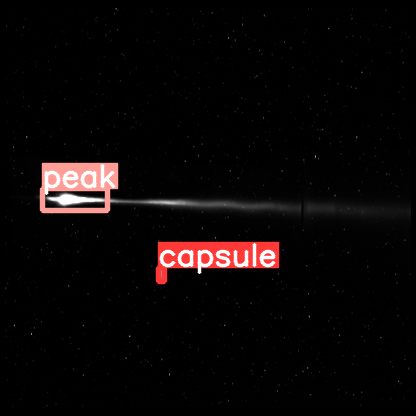

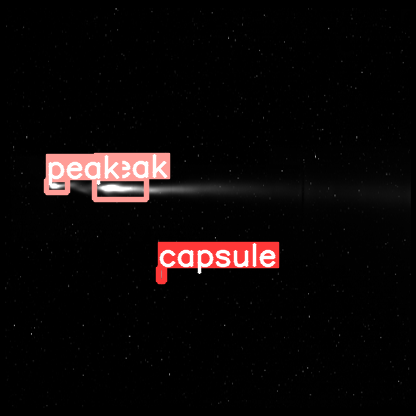

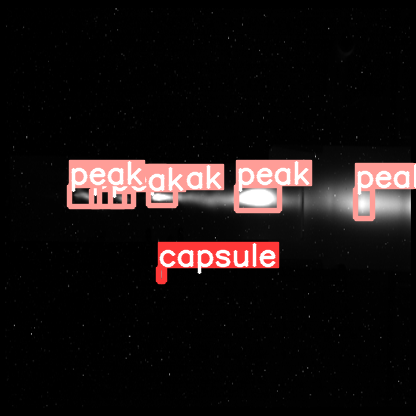

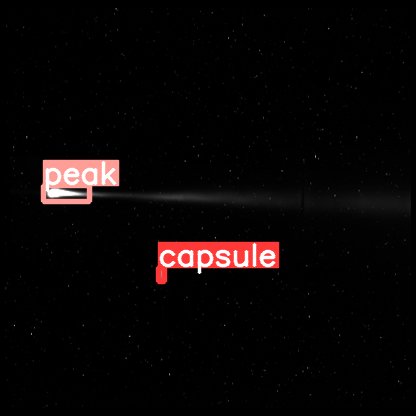

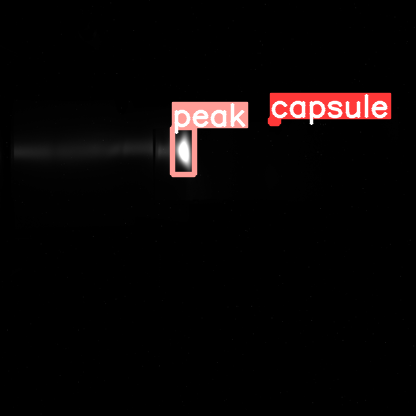

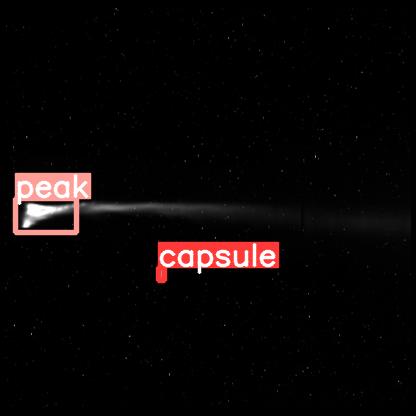

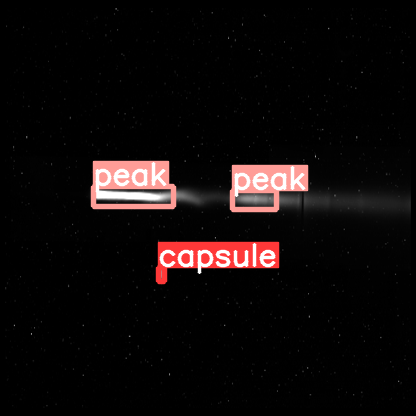

In [ ]:

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import files
files.download('/content/predictions.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights /content/yolov5/best.pt --img 416 --conf 0.1 --source /content/yolov5/RawImageRun22/ --hide-conf 

detect: weights=['/content/yolov5/best.pt'], source=/content/yolov5/RawImageRun22/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=True, half=False, dnn=False
YOLOv5 🚀 v6.1-36-gc09fb2a torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/20 /content/yolov5/RawImageRun22/20210330_022_1821_ProbeMagnified (23187222).png: 320x416 1 shock, Done. (0.016s)
image 2/20 /content/yolov5/RawImageRun22/20210330_022_1822_ProbeMagnified (23187222).png: 320x416 1 shock, Done. (0.013s)
image 3/20 /content/yolov5/RawImageRun22/20210330_022_1823_ProbeMagnified (23187222).png: 320x416 1 shock, Done. (0.013s)
image 4

In [ ]:
!zip -r /content/rawRun22.zip /content/yolov5/runs/detect/exp7
# from google.colab import files
# files.download('/content/exp4.zip')


  adding: content/yolov5/runs/detect/exp7/ (stored 0%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1837_ProbeMagnified (23187222).png (deflated 36%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1826_ProbeMagnified (23187222).png (deflated 36%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1840_ProbeMagnified (23187222).png (deflated 38%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1835_ProbeMagnified (23187222).png (deflated 39%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1839_ProbeMagnified (23187222).png (deflated 38%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1829_ProbeMagnified (23187222).png (deflated 39%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1825_ProbeMagnified (23187222).png (deflated 37%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1827_ProbeMagnified (23187222).png (deflated 38%)
  adding: content/yolov5/runs/detect/exp7/20210330_022_1828_ProbeMagnified (23187222).png (deflated 39%)


In [ ]:
!python detect.py --weights /content/yolov5/best.pt --img 416 --conf 0.1 --source /content/yolov5/bkgSubtractedRun22/ --hide-conf 

detect: weights=['/content/yolov5/best.pt'], source=/content/yolov5/bkgSubtractedRun22/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=True, half=False, dnn=False
YOLOv5 🚀 v6.1-36-gc09fb2a torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/20 /content/yolov5/bkgSubtractedRun22/pw20210330_022_0.png: 320x416 1 plasmawave, 1 shock, Done. (0.014s)
image 2/20 /content/yolov5/bkgSubtractedRun22/pw20210330_022_1.png: 320x416 2 dusts, 1 plasmawave, 1 shock, Done. (0.013s)
image 3/20 /content/yolov5/bkgSubtractedRun22/pw20210330_022_10.png: 320x416 2 dusts, 1 plasmawave, 1 shock, Done. (0.013s)
image 4

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!zip -r /content/bkgSubtractedRun22.zip /content/yolov5/runs/detect/exp8


  adding: content/yolov5/runs/detect/exp8/ (stored 0%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_8.png (deflated 19%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_17.png (deflated 20%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_10.png (deflated 19%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_18.png (deflated 19%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_12.png (deflated 19%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_16.png (deflated 19%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_9.png (deflated 20%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_19.png (deflated 20%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_15.png (deflated 20%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_0.png (deflated 20%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_2.png (deflated 20%)
  adding: content/yolov5/runs/detect/exp8/pw20210330_022_7.png (deflated 19%)
  

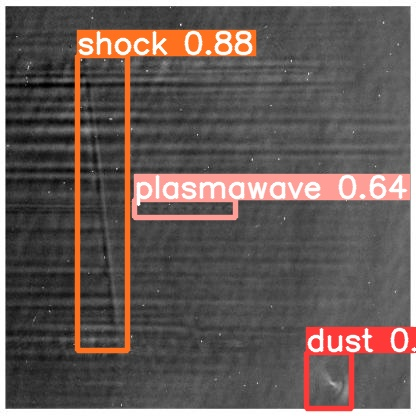

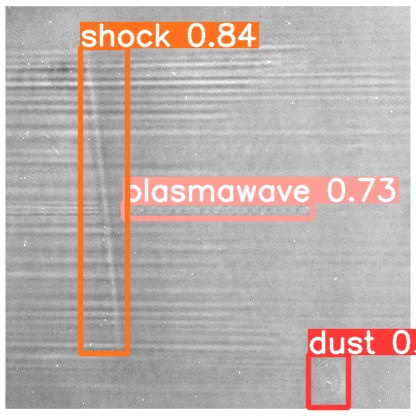

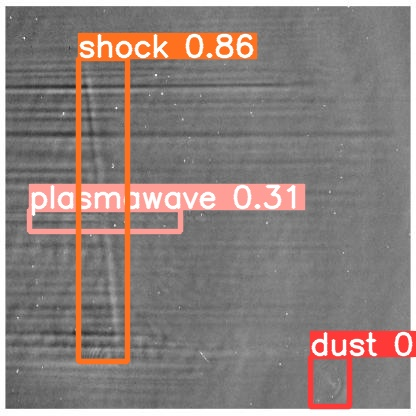

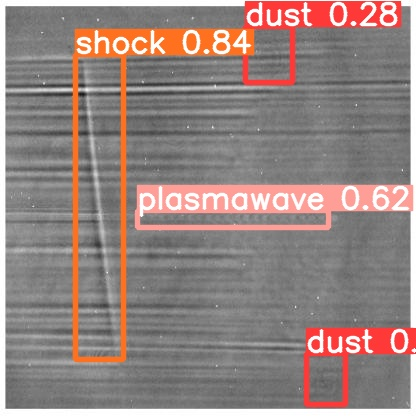

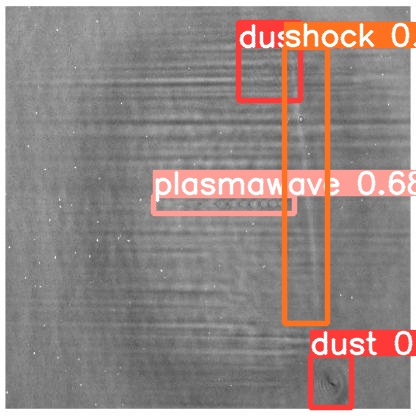

...

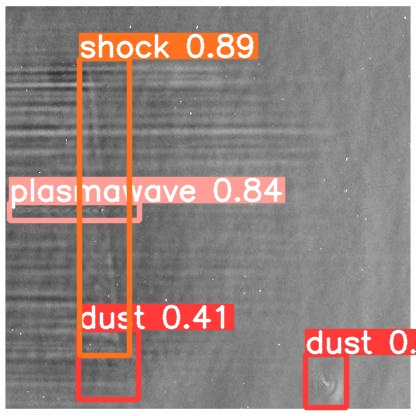

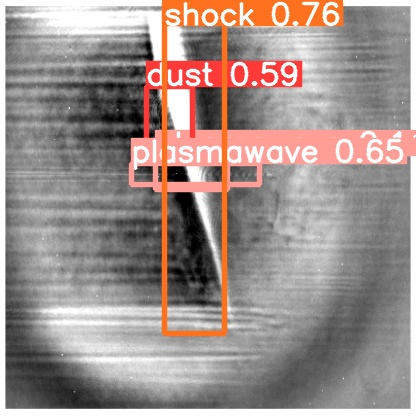

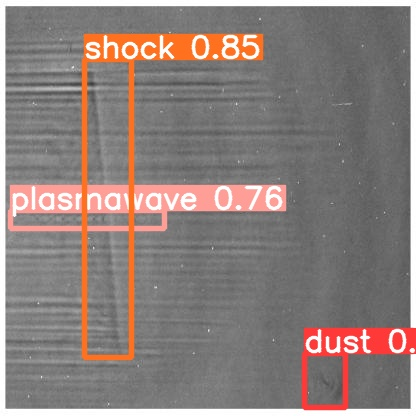

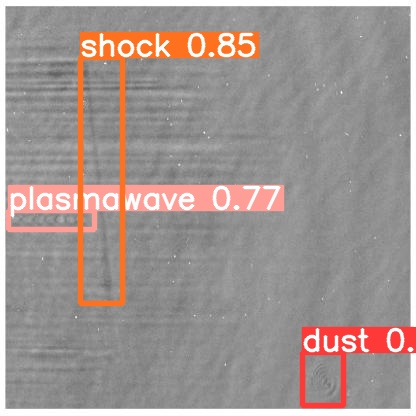

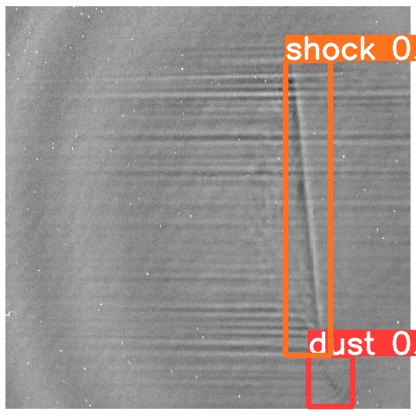

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python detect.py --weights /content/yolov5/best.pt --img 416 --conf 0.1 --source /content/yolov5/Inference/ --hide-conf 

detect: weights=['/content/yolov5/best.pt'], source=/content/yolov5/Inference/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=True, half=False, dnn=False
YOLOv5 🚀 v6.1-65-g7a2a118 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/3 /content/yolov5/Inference/20210330_011_1275_ProbeMagnified (23187222).png: 320x416 Done. (0.028s)
image 2/3 /content/yolov5/Inference/20210330_011_1276_ProbeMagnified (23187222).png: 320x416 Done. (0.026s)
image 3/3 /content/yolov5/Inference/20210330_011_1277_ProbeMagnified (23187222).png: 320x416 Done. (0.026s)
Speed: 0.4ms pre-process, 26.5ms inference, 3.2ms NM

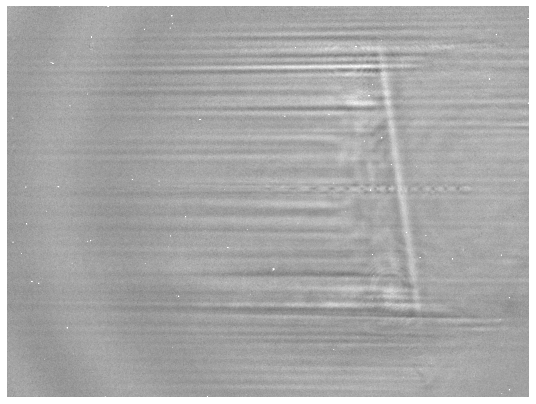

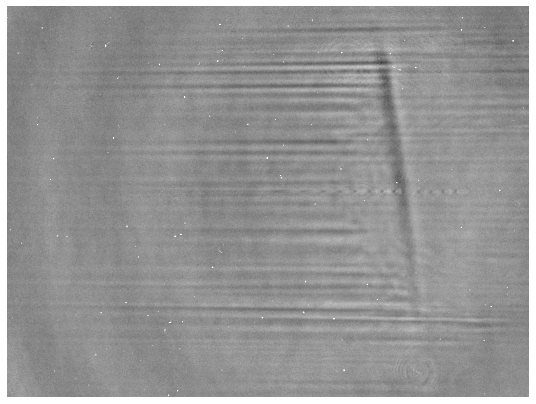

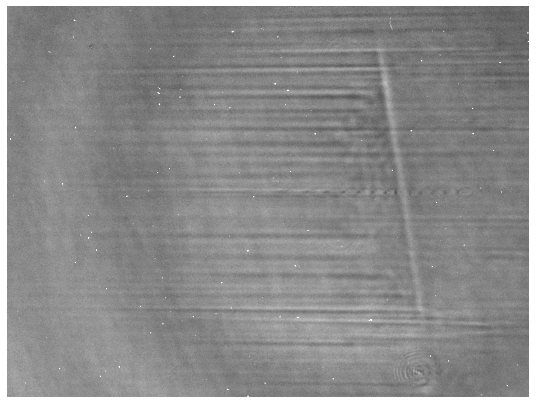

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!zip -r /content/NotClearShots.zip /content/yolov5/runs/detect/exp5

  adding: content/yolov5/runs/detect/exp5/ (stored 0%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_026_0.png (deflated 19%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_024_8.png (deflated 23%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_023_22.png (deflated 24%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_022_9.png (deflated 21%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_022_4.png (deflated 21%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_023_8.png (deflated 22%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_027_15.png (deflated 23%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_024_30.png (deflated 23%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_022_29.png (deflated 19%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_023_37.png (deflated 24%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_023_27.png (deflated 24%)
  adding: content/yolov5/runs/detect/exp5/pw20210331_027_7.png (deflated 22%)
  a

In [ ]:
from google.colab import files
files.download('/content/inferenceNotClearShots.zip')

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp5/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>